In [1]:
import os # This is for handling the file
import pickle # This is for storing some numpy feature
import numpy as np
from tqdm.notebook import tqdm # To know how much data has processed till now

from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input # This for extracting and prepeocessing the feature from image data
from tensorflow.keras.preprocessing.image import load_img,img_to_array
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Model
from tensorflow.keras.utils import to_categorical,plot_model
from tensorflow.keras.layers import Input, Dense, LSTM, Embedding, Dropout, add
import tensorflow as tf
from keras.models import load_model

In [2]:
BASE_DIR = 'D:/Minor-2/flickr30k'
WORKING_DIR = 'D:/Minor-2/flickr30k/Model'

<!-- Extracting Image feature -->

In [3]:
# loading vgg16 model
model = VGG16()
# restructure the model
model = Model(inputs=model.inputs, outputs=model.layers[-2].output)
# Summarize
print(model.summary())

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1 (Dense)                     │ (None, 4096)           │   102,764,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2 (Dense)                     │ (None, 4096)           │    16,781,312 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 134,260,544 (512.16 MB)

 Trainable params: 134,260,544 (512.16 MB)

 Non-trainable params: 0 (0.00 B)

None


In [4]:
# # Extracting feature from image
# features = {}
# directory = os.path.join(BASE_DIR, 'flickr30k_images')

# for img_name in tqdm(os.listdir(directory)):
#     # load the image from file
#     img_path = directory + '/' + img_name
#     image = load_img(img_path, target_size=(224, 224))
#     # convert image pixels to numpy array
#     image = img_to_array(image)
#     # reshape data for model
#     image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))
#     # preprocess image for vgg
#     image = preprocess_input(image)
#     # extract features
#     feature = model.predict(image, verbose=0)
#     # get image ID
#     image_id = img_name.split('.')[0]
#     # store feature
#     features[image_id] = feature

In [5]:
# # Storing the features in pickle(to not go with the previous processes again and again)
# pickle.dump(features, open(os.path.join(WORKING_DIR, 'features.pkl'), 'wb'))

In [6]:
# Loading the feature from pickle
with open(os.path.join(WORKING_DIR, 'features.pkl'), 'rb') as f:
    features = pickle.load(f)

<!-- LOADING THE CAPTION DATA -->

In [7]:
with open(os.path.join(BASE_DIR, 'Arabic_Caption_Only.txt'), 'r',encoding="utf8") as f:
    next(f) # This is for ignoring the first row i.e the title of the columns 
    captions_doc = f.read()

In [8]:
print(captions_doc)

1000092795.jpg	 ينظر شابان شابان ذوو شعر أشعث إلى أيديهما أثناء التسكع في الفناء.
1000092795.jpg	 يوجد اثنان من الذكور البيض في الخارج بالقرب من العديد من الشجيرات.
1000092795.jpg	 رجلان في القمصان الخضراء يقفان في الفناء.
1000092795.jpg	 رجل في قميص أزرق يقف في حديقة.
1000092795.jpg	 صديقان يستمتعان بالوقت الذي يقضيه معًا.
10002456.jpg	 يعمل العديد من الرجال في القبعات الصلبة على تشغيل نظام بكرة عملاقة.
10002456.jpg	 ينظر العمال إلى أسفل من أعلى على قطعة من المعدات.
10002456.jpg	 رجلان يعملان على آلة يرتدي قبعات صلبة.
10002456.jpg	 أربعة رجال على قمة هيكل طويل القامة.
10002456.jpg	 ثلاثة رجال على منصة كبيرة.
1000268201.jpg	 طفل يرتدي ثوبًا ورديًا يتسلق مجموعة من الدرج بطريقة دخول.
1000268201.jpg	 فتاة صغيرة في فستان وردي تدخل في مقصورة خشبية.
1000268201.jpg	 فتاة صغيرة تتسلق الدرج إلى مسرحها.
1000268201.jpg	 فتاة صغيرة تتسلق إلى مسرح خشبي
1000268201.jpg	 فتاة تذهب إلى مبنى خشبي.
1000344755.jpg	 يقف شخص ما في قميص وقبعة زرقاء على درج ويميل على نافذة.
1000344755.jpg	 رجل يرتدي قميصًا أز

In [9]:
# Mapping of images to captions
mapping = {}
# process lines
for line in tqdm(captions_doc.split('\n')):
    # split the line by space( )
    tokens = line.split(' ') #-----tokens[0]=token id & tokens[1]=caption
    if len(line) < 2:
        continue
    image_id, caption = tokens[0], tokens[1:]
    # remove extension from image ID
    image_id = image_id.split('.')[0]
    # convert caption list to string
    caption = " ".join(caption)
    # create list if needed
    if image_id not in mapping:
        mapping[image_id] = []
    # store the caption
    mapping[image_id].append(caption)

  0%|          | 0/158916 [00:00<?, ?it/s]

In [10]:
len(mapping)#Number of images

31783

In [16]:
# Preprocessing the captions
import re
import nltk
from nltk.tokenize import word_tokenize
from nltk.stem import ISRIStemmer

# Tokenization and stemming setup
nltk.download('punkt')  # Ensure the punkt tokenizer is downloaded
stemmer = ISRIStemmer()

def clean(mapping):
    for key, captions in mapping.items():
        for i in range(len(captions)):
            # take one caption at a time
            caption = captions[i]
            # preprocessing steps
           
            # delete digits, special chars, etc.,
            caption = re.sub('[A-Za-z]', '',captions[i])
            # delete additional spaces
            caption = caption.replace('\s+', ' ')
            # add start and end tags to the caption
            # Tokenization
            tokens = word_tokenize(caption)
            # Stemming
            stemmed_tokens = [stemmer.stem(token) for token in tokens]
            caption = 'startseq ' + " ".join([word for word in caption.split() if len(word)>1]) + ' endseq'
            captions[i] = caption

<>:21: SyntaxWarning: invalid escape sequence '\s'
<>:21: SyntaxWarning: invalid escape sequence '\s'
C:\Users\HP\AppData\Local\Temp\ipykernel_8792\3606094933.py:21: SyntaxWarning: invalid escape sequence '\s'
  caption = caption.replace('\s+', ' ')
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\HP\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [17]:
# Before preprocessing of text
mapping['1000092795']

['startseq ينظر شابان شابان ذوو شعر أشعث إلى أيديهما أثناء التسكع في الفناء. endseq',
 'startseq يوجد اثنان من الذكور البيض في الخارج بالقرب من العديد من الشجيرات. endseq',
 'startseq رجلان في القمصان الخضراء يقفان في الفناء. endseq',
 'startseq رجل في قميص أزرق يقف في حديقة. endseq',
 'startseq صديقان يستمتعان بالوقت الذي يقضيه معًا. endseq']

In [18]:
#preprocessing the caption
clean(mapping)

In [19]:
# After preprocessing
mapping['1000092795']

['startseq ينظر شابان شابان ذوو شعر أشعث إلى أيديهما أثناء التسكع في الفناء. endseq',
 'startseq يوجد اثنان من الذكور البيض في الخارج بالقرب من العديد من الشجيرات. endseq',
 'startseq رجلان في القمصان الخضراء يقفان في الفناء. endseq',
 'startseq رجل في قميص أزرق يقف في حديقة. endseq',
 'startseq صديقان يستمتعان بالوقت الذي يقضيه معًا. endseq']

In [20]:
# Storing all the captions in a single list
all_captions = []
for key in mapping:
    for caption in mapping[key]:
        all_captions.append(caption)

In [21]:
# Total number of captions 
len(all_captions)

158915

In [22]:
all_captions[:10]

['startseq ينظر شابان شابان ذوو شعر أشعث إلى أيديهما أثناء التسكع في الفناء. endseq',
 'startseq يوجد اثنان من الذكور البيض في الخارج بالقرب من العديد من الشجيرات. endseq',
 'startseq رجلان في القمصان الخضراء يقفان في الفناء. endseq',
 'startseq رجل في قميص أزرق يقف في حديقة. endseq',
 'startseq صديقان يستمتعان بالوقت الذي يقضيه معًا. endseq',
 'startseq يعمل العديد من الرجال في القبعات الصلبة على تشغيل نظام بكرة عملاقة. endseq',
 'startseq ينظر العمال إلى أسفل من أعلى على قطعة من المعدات. endseq',
 'startseq رجلان يعملان على آلة يرتدي قبعات صلبة. endseq',
 'startseq أربعة رجال على قمة هيكل طويل القامة. endseq',
 'startseq ثلاثة رجال على منصة كبيرة. endseq']

In [23]:
# tokenize the text
tokenizer = Tokenizer()
tokenizer.fit_on_texts(all_captions)
vocab_size = len(tokenizer.word_index) + 1  # total number of unique words we are having + 1

In [24]:
vocab_size

36823

In [25]:
# getting the maximum length of the caption available
max_length = max(len(caption.split()) for caption in all_captions)
max_length

62

<!-- Train Test and Split -->

In [26]:
image_ids = list(mapping.keys())
split = int(len(image_ids) * 0.90)# taking 90% as training data i.e 28604(for training)
train = image_ids[:split]
test = image_ids[split:]# for testing---3179 images

In [27]:
# This data generator(easy to load the model and drain it) is for those who has less than 16gb RAM and this help to fetch image and caption in batch size
# data generator avoid session crash 
# data_keys= image id
def data_generator(data_keys, mapping, features, tokenizer, max_length, vocab_size, batch_size):    
    # loop over images
    X1, X2, y = list(), list(), list()
    n = 0   #this for determining whether we reach the batch size or not
    while 1:  #infinite loop
        for key in data_keys:
            n += 1
            captions = mapping[key]
            # process each caption
            for caption in captions:
                # encode the sequence
                seq = tokenizer.texts_to_sequences([caption])[0]
                # split the sequence into X, y pairs
                for i in range(1, len(seq)):
                    # split into input and output pairs
                    in_seq, out_seq = seq[:i], seq[i]
                    # pad input sequence
                    in_seq = pad_sequences([in_seq], maxlen=max_length)[0]
                    # encode output sequence
                    out_seq = to_categorical([out_seq], num_classes=vocab_size)[0]

                    # store the sequences
                    X1.append(features[key][0]) # features of image
                    X2.append(in_seq)  # text feature
                    y.append(out_seq)  #output 
            if n == batch_size:
                X1, X2, y = np.array(X1), np.array(X2), np.array(y) # model to process the normal list
                yield (X1, X2), y  # yield= this will return the collected samples to the generator so this willbe consume by the model & y= output
                X1, X2, y = list(), list(), list() #reinitialisation because of memory exhausted
                n = 0


<!-- MODEL CREATION -->

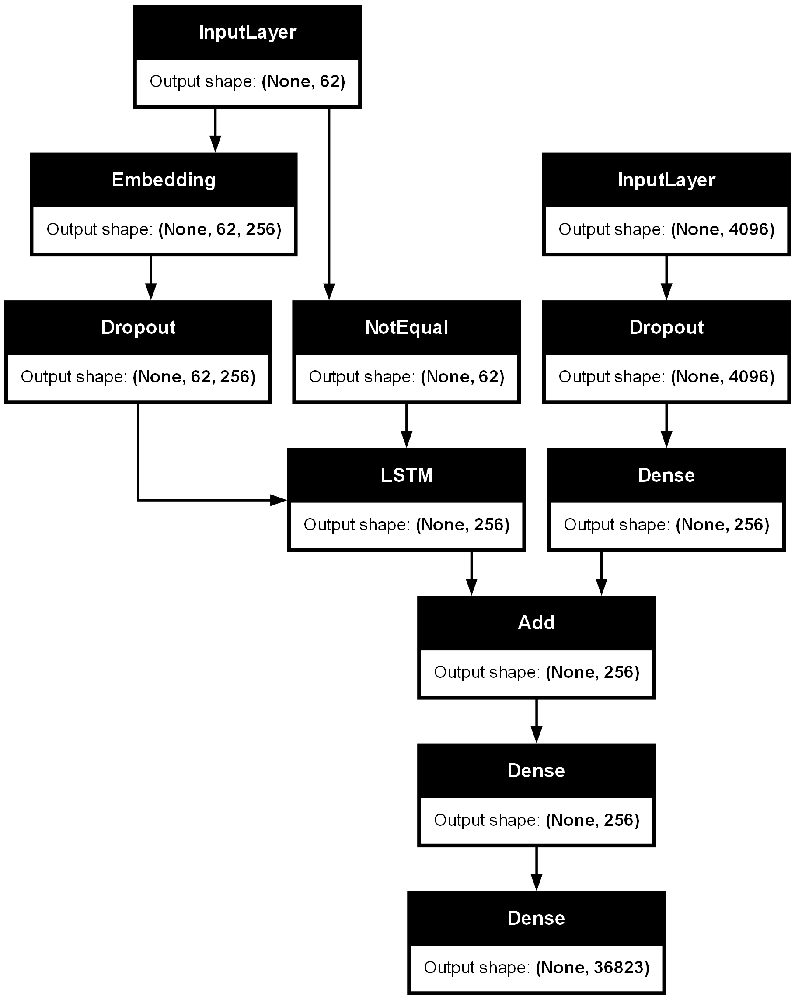

In [28]:
# Encoder model-----
# image feature layers
inputs1 = Input(shape=(4096,))
fe1 = Dropout(0.4)(inputs1)
fe2 = Dense(256, activation='relu')(fe1)

# sequence feature layers
inputs2 = Input(shape=(max_length,))
se1 = Embedding(vocab_size, 256, mask_zero=True)(inputs2)#dimensions of the input
se2 = Dropout(0.4)(se1)# 0.4 or 0.5 to avoid overfitting
se3 = LSTM(256)(se2)

# decoder model-------
decoder1 = add([fe2, se3])#concating the feature
decoder2 = Dense(256, activation='relu')(decoder1)
outputs = Dense(vocab_size, activation='softmax')(decoder2)#for categorical vocabulary

model = Model(inputs=[inputs1, inputs2], outputs=outputs)
model.compile(loss='categorical_crossentropy', optimizer='adam')

# plot the model
plot_model(model, show_shapes=True)

In [78]:
# # Train the model
# epochs = 1
# batch_size = 64
# steps = len(train) // batch_size

# for i in range(epochs):
#     # create data generator
#     generator = data_generator(train, mapping, features, tokenizer, max_length, vocab_size, batch_size)
#     # fit for one epoch
#     model.fit(generator, epochs=1, steps_per_epoch=steps, verbose=1)# from generator we will get the x1, x2 and y

In [79]:
# Saving the model
# model.save(WORKING_DIR+'/New_model.h5')  

In [80]:
# To load the trained model

# model = load_model('D:/Minor-2/flickr30k/Model/New_model.h5')

<!-- Generating Caption for the image -->

In [29]:
# converting id to word i.e index to word(this is our helper function)
def idx_to_word(integer,tokenizer):
    for word, index in tokenizer.word_index.items():
        if index==integer:
            return word
    return None


In [30]:
# Generate caption for an image
def predict_caption(model, image, tokenizer, max_length):
    # add start tag for generation process
    in_text = 'startseq '
    # iterate over the max length of sequence
    for i in range(max_length):
        # encode input sequence
        sequence = tokenizer.texts_to_sequences([in_text])[0]
        # pad the sequence
        sequence = pad_sequences([sequence], max_length)
        # predict next word
        yhat = model.predict([image, sequence], verbose=0) # verbose=0 means we don't have to display anything
        # get index with high probability
        yhat = np.argmax(yhat)
        # convert index to word
        word = idx_to_word(yhat, tokenizer)
        # stop if word not found
        if word is None:
            break
        # append word as input for generating next word
        in_text += " " + word
        # stop if we reach end tag
        if word == ' endseq':
            break

    return in_text

In [31]:
from nltk.translate.bleu_score import corpus_bleu
# validate with test data
actual, predicted = list(), list()

for key in tqdm(test):
    # get actual caption
    captions = mapping[key]
    # predict the caption for image
    y_pred = predict_caption(model, features[key], tokenizer, max_length)
    # split into words
    actual_captions = [caption.split() for caption in captions]
    y_pred = y_pred.split()
    # append to the list
    actual.append(actual_captions)
    predicted.append(y_pred)

  0%|          | 0/3179 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [84]:
# Saving the actual and predicted list in a file to use in future 
# with open('actual_predicted.pkl', 'wb') as f:
#     pickle.dump((actual, predicted), f)

In [85]:
# Load the data from the pickle file
with open('actual_predicted.pkl', 'rb') as f:
    actual, predicted = pickle.load(f)

In [89]:
# calcuate BLEU score(this we consider only when we work with text data. this will have n-gram score)
print("BLEU-1: %f" % corpus_bleu(actual, predicted, weights=(1.0, 0, 0, 0)))
print("BLEU-2: %f" % corpus_bleu(actual, predicted, weights=(0.5, 0.5, 0, 0)))

TypeError: Fraction.__new__() got an unexpected keyword argument '_normalize'

In [87]:
# Visualising the results
from PIL import Image
import matplotlib.pyplot as plt
def generate_caption(image_name):
    # load the image
   
    image_id = image_name.split('.')[0]
    img_path = os.path.join(BASE_DIR, "flickr30k_images", image_name)
    image = Image.open(img_path)
    captions = mapping[image_id]
    print('---------------------Actual---------------------')
    for caption in captions:
        print(caption)
    # predict the caption
    y_pred = predict_caption(model, features[image_id], tokenizer, max_length)
    print('--------------------Predicted--------------------')
    print(y_pred)
    plt.imshow(image)

---------------------Actual---------------------
startseq يوجد أداء في الشوارع يرتدي تمثالًا في منتصف الشارع. endseq
startseq يرتدي الشخص ثوبًا يتجول في شوارع المدينة. endseq
startseq الأشخاص الذين يسيرون من قبلهم يحدقون في المرأة في الشارع. endseq
startseq يقف أداء الشارع ذو اللون الذهبي في الشارع. endseq
startseq الشخص يقف في زي في الشارع. endseq
--------------------Predicted--------------------
startseq  لسرير لسرير لسرير لسرير لسرير لسرير لسرير لسرير لسرير لسرير لسرير لسرير لسرير لسرير لسرير لسرير لسرير لسرير لسرير لسرير لسرير لسرير لسرير لسرير لسرير لسرير لسرير لسرير لسرير لسرير لسرير لسرير لسرير لسرير لسرير لسرير لسرير لسرير لسرير لسرير لسرير لسرير لسرير لسرير لسرير لسرير لسرير لسرير لسرير لسرير لسرير لسرير لسرير لسرير لسرير لسرير لسرير لسرير لسرير لسرير لسرير لسرير


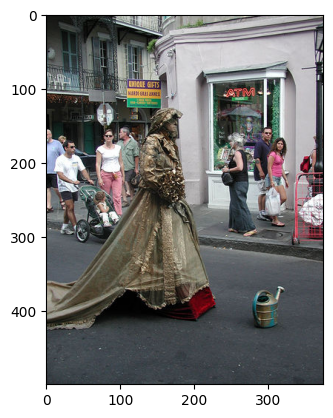

In [88]:
generate_caption("390369.jpg")

<!-- TESTING -->